# UMAPs Neurips samples, NK cells

In this notebook UMAPs are generated from latent space, CLR transformed protein counts and RNA expression to compare the clustering results. Leiden algorithm is used to identify clusters and clusters are compared between latent vs protein, latent vs rna and rna vs protein. Sankey plots are used in comparisons. 

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import anndata as ad
import scvi
import scanpy as sc
import umap

from ridgeplot import ridgeplot
from pySankey import sankey

import warnings

warnings.filterwarnings('ignore')



Global seed set to 0
/Users/tiinatuononen/opt/anaconda3/envs/tiina-env/lib/python3.10/site-packages/pytorch_lightning/utilities/warnings.py:53: LightningDeprecationWarning: pytorch_lightning.utilities.warnings.rank_zero_deprecation has been deprecated in v1.6 and will be removed in v1.8. Use the equivalent function from the pytorch_lightning.utilities.rank_zero module instead.
  new_rank_zero_deprecation(
/Users/tiinatuononen/opt/anaconda3/envs/tiina-env/lib/python3.10/site-packages/pytorch_lightning/utilities/warnings.py:58: LightningDeprecationWarning: The `pytorch_lightning.loggers.base.rank_zero_experiment` is deprecated in v1.7 and will be removed in v1.9. Please use `pytorch_lightning.loggers.logger.rank_zero_experiment` instead.
  return new_rank_zero_deprecation(*args, **kwargs)


# 1. Latent space

## 1.1 UMAPs, latent space

In [2]:
#Neurips
adata_neurips_latent = sc.read_h5ad('/Users/tiinatuononen/Desktop/Thesis/Project/data/adata_neurips_norm_outer.h5ad')

In [5]:
#Computing a neighborhood of observations using latent space

sc.pp.neighbors(adata_neurips_latent, use_rep="X_totalVI")   

sc.tl.umap(adata_neurips_latent)

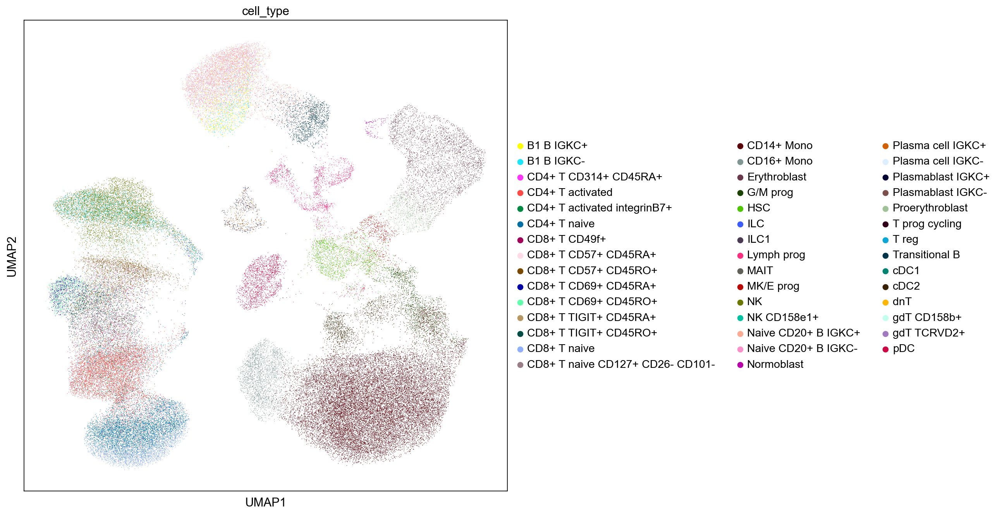

In [6]:
#Whole Neurips dataset plotted

sc.set_figure_params(figsize=(10, 10))

sc.pl.umap(adata_neurips_latent, color = ['cell_type'], color_map = 'viridis')

In [9]:
#selecting NK cells, gd T cells and ILCs from whole dataset

nk_all_latent = adata_neurips_latent[(adata_neurips_latent.obs['cell_type'] == "NK") | (adata_neurips_latent.obs['cell_type'] == "NK CD158e1+") | (adata_neurips_latent.obs['cell_type'] == "ILC") | (adata_neurips_latent.obs['cell_type'] == "gdT CD158b+")]   



## 1.2 Leiden clusters, latent space

In [26]:
#only one sample

sc.tl.leiden(adata_neurips_latent, resolution = 2) #default resolution = 1.0

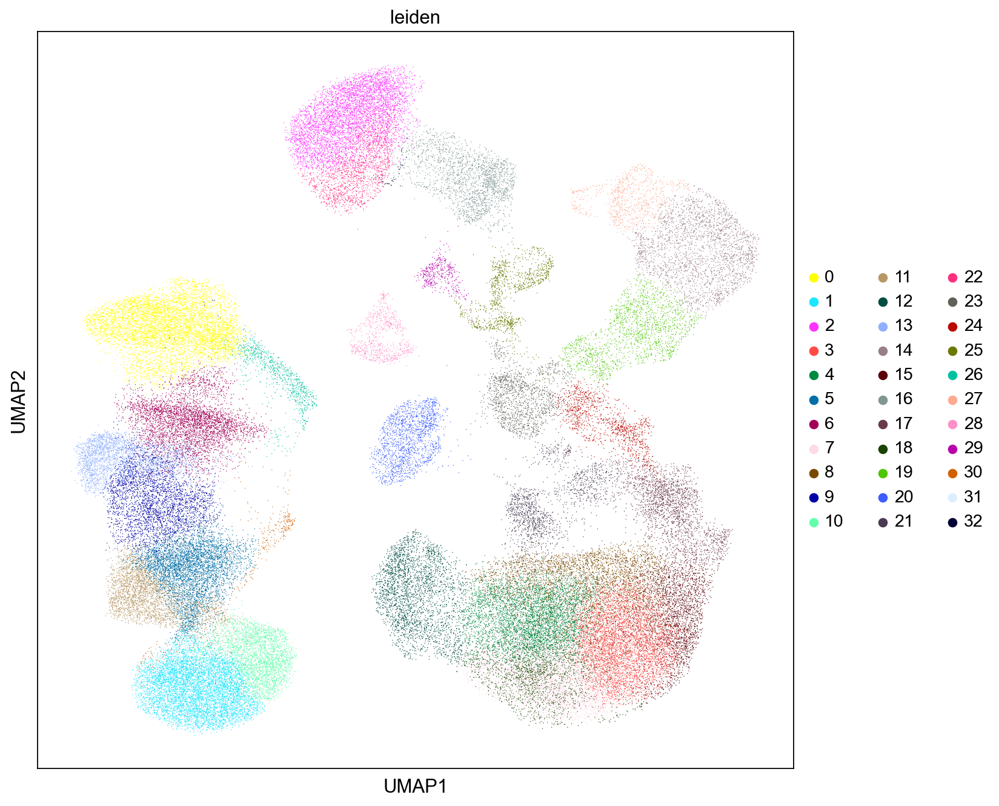

In [27]:
sc.set_figure_params(figsize=(10, 10))

sc.pl.umap(adata_neurips_latent, color = ['leiden'], color_map = 'viridis')

In [119]:
#selecting one sample from Neurips

leiden_latent=adata_neurips_latent[adata_neurips_latent.obs['POOL'] == "s4d1"]

leiden_latent_s1d1=adata_neurips_latent[adata_neurips_latent.obs['POOL'] == "s1d1"]

In [105]:
leiden_latent_nk = adata_neurips_latent[(adata_neurips_latent.obs['cell_type'] == "NK") | (adata_neurips_latent.obs['cell_type'] == "NK CD158e1+") | (adata_neurips_latent.obs['cell_type'] == "ILC") | (adata_neurips_latent.obs['cell_type'] == "gdT CD158b+")]   

# 2. CLR transformed protein data

## 2.1. UMAPs, protein

In [29]:
#Neurips

adata_neurips_prot = sc.read_h5ad('/Users/tiinatuononen/Desktop/Thesis/Project/data/adata_neurips_norm_outer.h5ad').copy()

In [30]:
#Computing a neighborhood of observations using CLR transformed protein data

sc.pp.neighbors(adata_neurips_prot, use_rep="protein_expression_clr_neurips") 

sc.tl.umap(adata_neurips_prot)

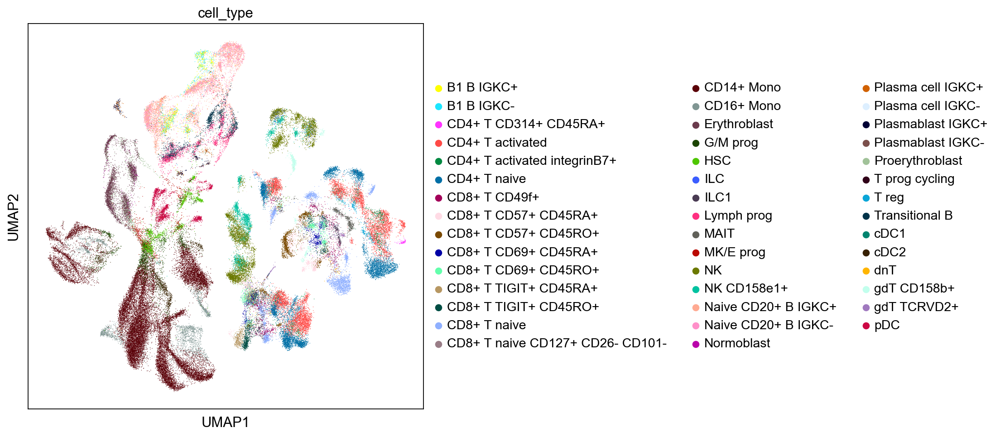

In [31]:
#whole Neurips dataset, coloured by samples

sc.set_figure_params(figsize=(7, 7))

sc.pl.umap(adata_neurips_prot, color = ['cell_type'], color_map = 'viridis')

## 2.2 Leiden, protein

In [49]:
sc.tl.leiden(adata_neurips_prot, resolution = 0.5) #default resolution = 1.0

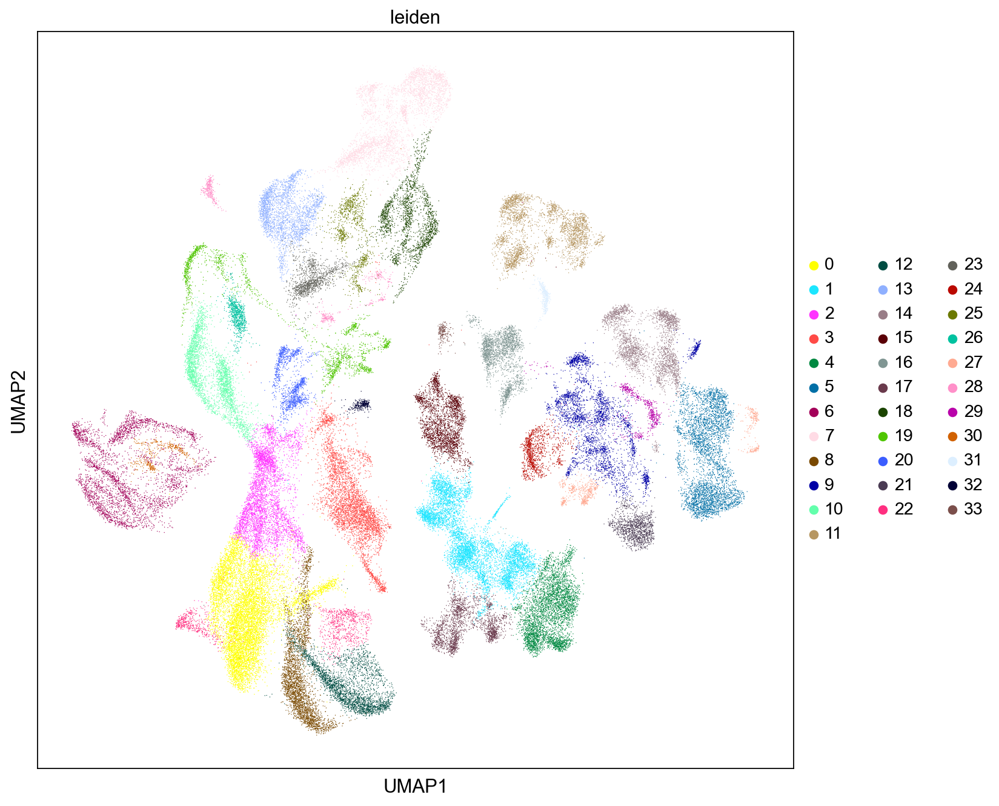

In [50]:
sc.set_figure_params(figsize=(10, 10))

sc.pl.umap(adata_neurips_prot, color = ['leiden'], color_map = 'viridis')

In [118]:
#selecting one sample from Neurips

leiden_prot=adata_neurips_prot[adata_neurips_prot.obs['POOL'] == "s4d1"]

leiden_prot_s1d1=adata_neurips_prot[adata_neurips_prot.obs['POOL'] == "s1d1"]

In [106]:
leiden_prot_nk = adata_neurips_prot[(adata_neurips_prot.obs['cell_type'] == "NK") | (adata_neurips_prot.obs['cell_type'] == "NK CD158e1+") | (adata_neurips_prot.obs['cell_type'] == "ILC") | (adata_neurips_prot.obs['cell_type'] == "gdT CD158b+")]   

# 3. RNA expression

## 3.1. UMAPs, RNA expression

In [52]:
#Neurips

adata_neurips_rna = sc.read_h5ad('/Users/tiinatuononen/Desktop/Thesis/Project/data/adata_neurips_norm_outer.h5ad').copy()

In [53]:
adata_neurips_rna.obsm['adata_x'] = adata_neurips_rna.to_df()

In [54]:
import scipy.sparse

In [55]:
#loading in connectivities matrix (calculated from RNA expression) 

connect = scipy.sparse.load_npz('/Users/tiinatuononen/Desktop/Thesis/Project/data/connectivities (1).npz')

In [56]:
connect

<80998x80998 sparse matrix of type '<class 'numpy.float32'>'
	with 2261244 stored elements in Compressed Sparse Row format>

In [57]:
#addint connectivities matrix to obsm 

adata_neurips_rna.obsp['connectivities'] = connect

In [58]:
adata_neurips_rna

AnnData object with n_obs × n_vars = 80998 × 21720
    obs: 'GEX_n_genes_by_counts', 'GEX_pct_counts_mt', 'GEX_size_factors', 'GEX_phase', 'ADT_n_antibodies_by_counts', 'ADT_total_counts', 'ADT_iso_count', 'cell_type', 'batch', 'ADT_pseudotime_order', 'GEX_pseudotime_order', 'Samplename', 'Site', 'DonorNumber', 'Modality', 'VendorLot', 'DonorID', 'DonorAge', 'DonorBMI', 'DonorBloodType', 'DonorRace', 'Ethnicity', 'DonorGender', 'QCMeds', 'DonorSmoker', 'is_train', 'n_genes', 'percent_mito', 'percent_ribo', 'n_counts', 'leiden_r2', 'leiden_r2_n_genes_MAD_diff', 'leiden_r2_n_counts_MAD_diff', 'leiden_r2_percent_mito_MAD_diff', 'filter', 'model_group', 'BATCH', 'POOL', 'SAMPLE_SET', 'SAMPLE_TYPE', 'SAMPLE_TISSUE', 'DIAGNOSIS', 'SUBTYPE', 'STATUS'
    obsm: 'ADT_X_pca', 'ADT_X_umap', 'ADT_isotype_controls', 'GEX_X_pca', 'GEX_X_umap', 'X_pca', 'X_totalVI', 'X_umap', 'protein_expression', 'protein_expression_clr_neurips', 'adata_x'
    layers: 'counts'
    obsp: 'connectivities'

In [59]:
#loading in distance matrix (calculated from RNA expression)

dist = scipy.sparse.load_npz('/Users/tiinatuononen/Desktop/Thesis/Project/data/distances (1).npz')

In [60]:
dist

<80998x80998 sparse matrix of type '<class 'numpy.float64'>'
	with 1133972 stored elements in Compressed Sparse Row format>

In [61]:
adata_neurips_rna.obsp['distances'] = dist

In [62]:
adata_neurips_rna

AnnData object with n_obs × n_vars = 80998 × 21720
    obs: 'GEX_n_genes_by_counts', 'GEX_pct_counts_mt', 'GEX_size_factors', 'GEX_phase', 'ADT_n_antibodies_by_counts', 'ADT_total_counts', 'ADT_iso_count', 'cell_type', 'batch', 'ADT_pseudotime_order', 'GEX_pseudotime_order', 'Samplename', 'Site', 'DonorNumber', 'Modality', 'VendorLot', 'DonorID', 'DonorAge', 'DonorBMI', 'DonorBloodType', 'DonorRace', 'Ethnicity', 'DonorGender', 'QCMeds', 'DonorSmoker', 'is_train', 'n_genes', 'percent_mito', 'percent_ribo', 'n_counts', 'leiden_r2', 'leiden_r2_n_genes_MAD_diff', 'leiden_r2_n_counts_MAD_diff', 'leiden_r2_percent_mito_MAD_diff', 'filter', 'model_group', 'BATCH', 'POOL', 'SAMPLE_SET', 'SAMPLE_TYPE', 'SAMPLE_TISSUE', 'DIAGNOSIS', 'SUBTYPE', 'STATUS'
    obsm: 'ADT_X_pca', 'ADT_X_umap', 'ADT_isotype_controls', 'GEX_X_pca', 'GEX_X_umap', 'X_pca', 'X_totalVI', 'X_umap', 'protein_expression', 'protein_expression_clr_neurips', 'adata_x'
    layers: 'counts'
    obsp: 'connectivities', 'distances'

In [63]:
import pickle

with open('saved_dictionary.pkl', 'rb') as f:
    loaded_dict = pickle.load(f)

In [64]:
adata_neurips_rna.uns['neighbors'] = loaded_dict

In [65]:
adata_neurips_rna

AnnData object with n_obs × n_vars = 80998 × 21720
    obs: 'GEX_n_genes_by_counts', 'GEX_pct_counts_mt', 'GEX_size_factors', 'GEX_phase', 'ADT_n_antibodies_by_counts', 'ADT_total_counts', 'ADT_iso_count', 'cell_type', 'batch', 'ADT_pseudotime_order', 'GEX_pseudotime_order', 'Samplename', 'Site', 'DonorNumber', 'Modality', 'VendorLot', 'DonorID', 'DonorAge', 'DonorBMI', 'DonorBloodType', 'DonorRace', 'Ethnicity', 'DonorGender', 'QCMeds', 'DonorSmoker', 'is_train', 'n_genes', 'percent_mito', 'percent_ribo', 'n_counts', 'leiden_r2', 'leiden_r2_n_genes_MAD_diff', 'leiden_r2_n_counts_MAD_diff', 'leiden_r2_percent_mito_MAD_diff', 'filter', 'model_group', 'BATCH', 'POOL', 'SAMPLE_SET', 'SAMPLE_TYPE', 'SAMPLE_TISSUE', 'DIAGNOSIS', 'SUBTYPE', 'STATUS'
    uns: 'neighbors'
    obsm: 'ADT_X_pca', 'ADT_X_umap', 'ADT_isotype_controls', 'GEX_X_pca', 'GEX_X_umap', 'X_pca', 'X_totalVI', 'X_umap', 'protein_expression', 'protein_expression_clr_neurips', 'adata_x'
    layers: 'counts'
    obsp: 'connect

In [66]:
sc.tl.umap(adata_neurips_rna)

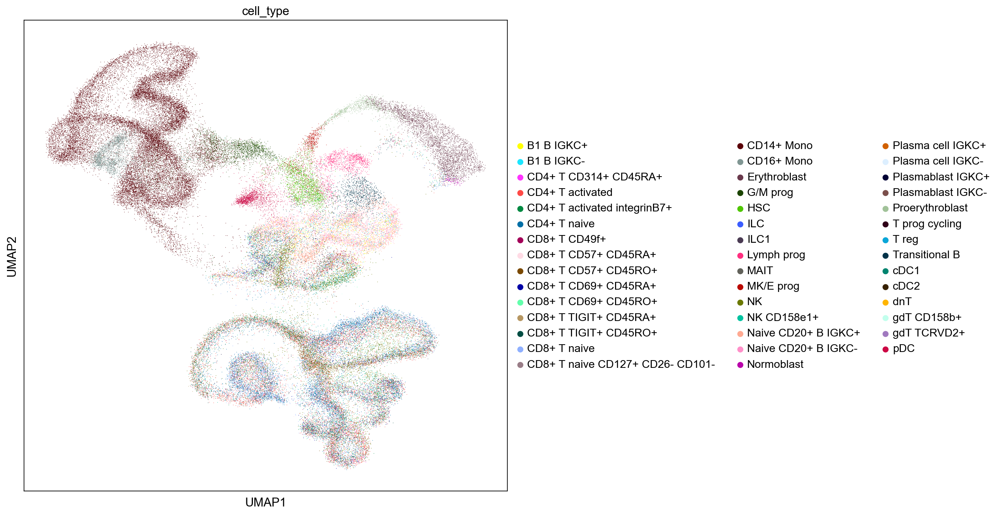

In [67]:
#wWhole Neurips dataset

sc.set_figure_params(figsize=(10, 10))

sc.pl.umap(adata_neurips_rna, color = ['cell_type'], color_map = 'viridis')

## 3.2. Leiden, RNA

In [89]:
sc.tl.leiden(adata_neurips_rna, resolution = 3.1) #default resolution = 1.0

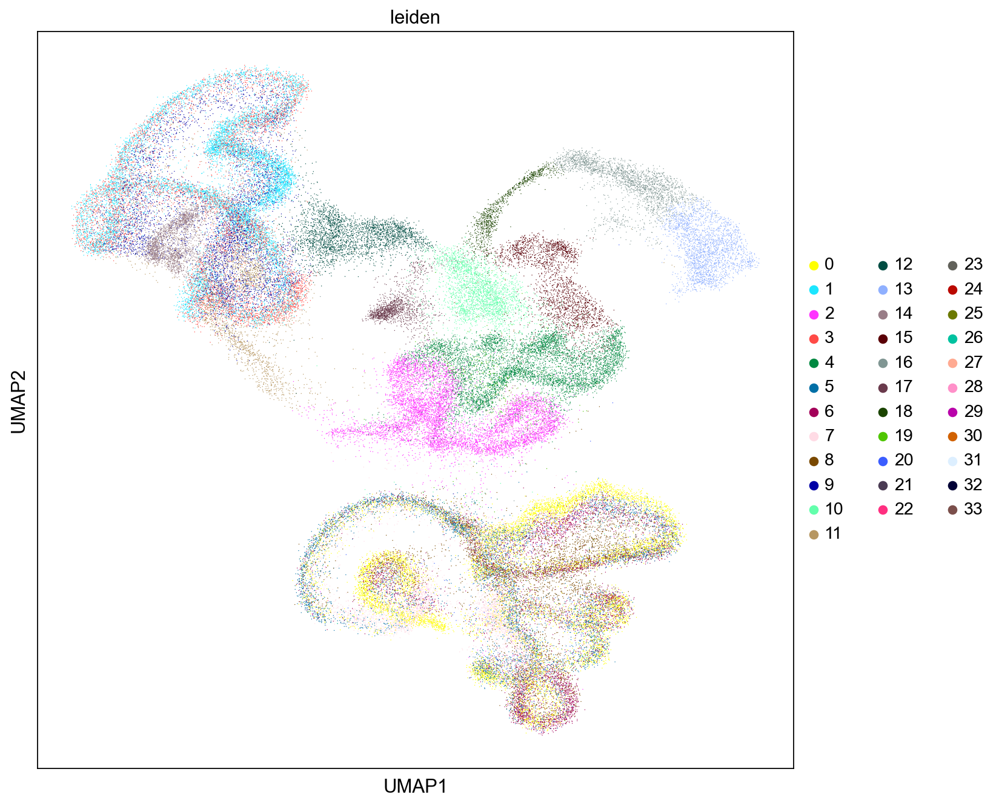

In [90]:
sc.set_figure_params(figsize=(10, 10))

sc.pl.umap(adata_neurips_rna, color = ['leiden'], color_map ='viridis')

In [117]:
#selecting one sample from Neurips

leiden_rna=adata_neurips_rna[adata_neurips_rna.obs['POOL'] == "s4d1"]

leiden_rna_s1d1=adata_neurips_rna[adata_neurips_rna.obs['POOL'] == "s1d1"]

In [108]:
#only selected cell types

leiden_rna_nk = adata_neurips_rna[(adata_neurips_rna.obs['cell_type'] == "NK") | (adata_neurips_rna.obs['cell_type'] == "NK CD158e1+") | (adata_neurips_rna.obs['cell_type'] == "ILC") | (adata_neurips_rna.obs['cell_type'] == "gdT CD158b+")]   

## Sankey plots

### Whole dataset

Latent vs protein


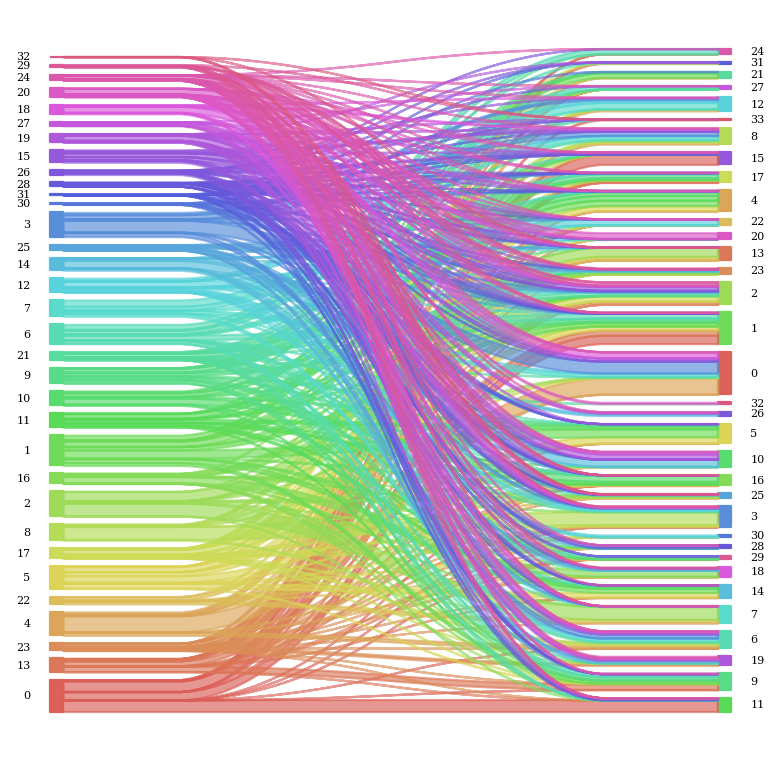

In [102]:
#latent vs protein

print("Latent vs protein")
sankey.sankey(adata_neurips_latent.obs.leiden, adata_neurips_prot.obs.leiden, aspect=20, fontsize=5)

Latent vs RNA


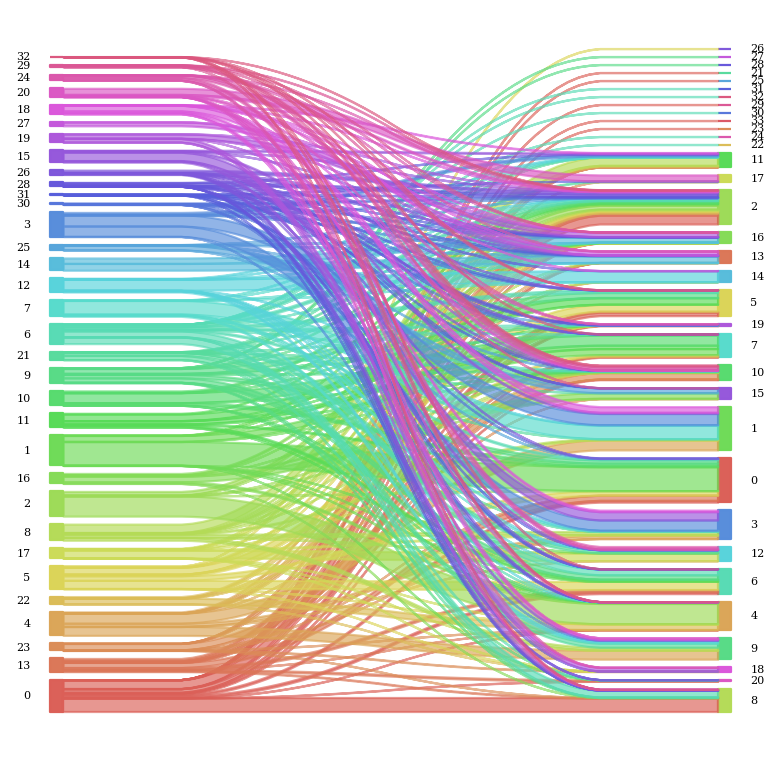

In [103]:
#latent vs rna

print("Latent vs RNA")
sankey.sankey(adata_neurips_latent.obs.leiden, adata_neurips_rna.obs.leiden, aspect=20, fontsize=5)

Protein vs RNA


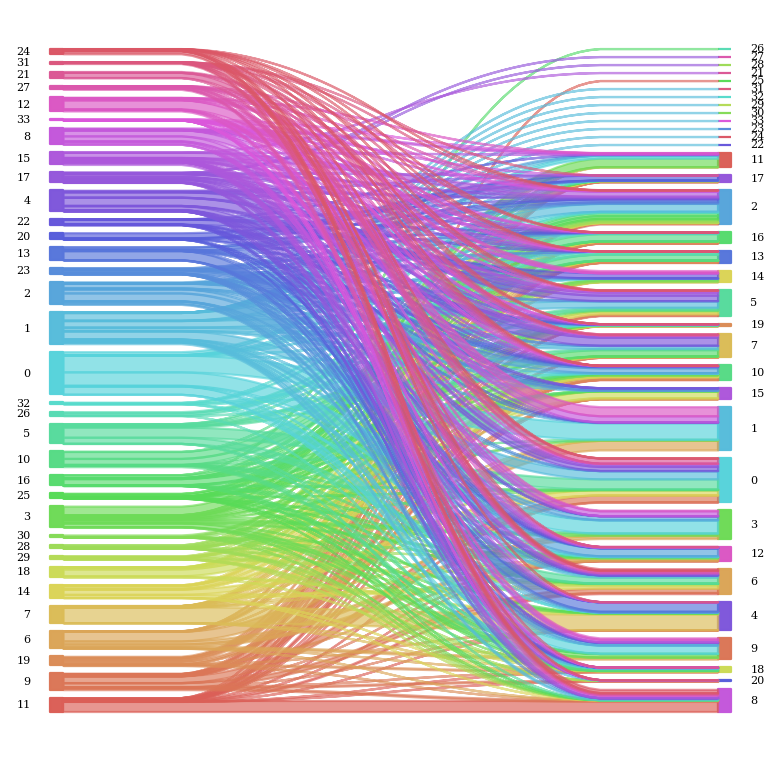

In [104]:
#protein vs rna

print("Protein vs RNA")
sankey.sankey(adata_neurips_prot.obs.leiden, adata_neurips_rna.obs.leiden, aspect=20, fontsize=5)

### Sample, s4d1 

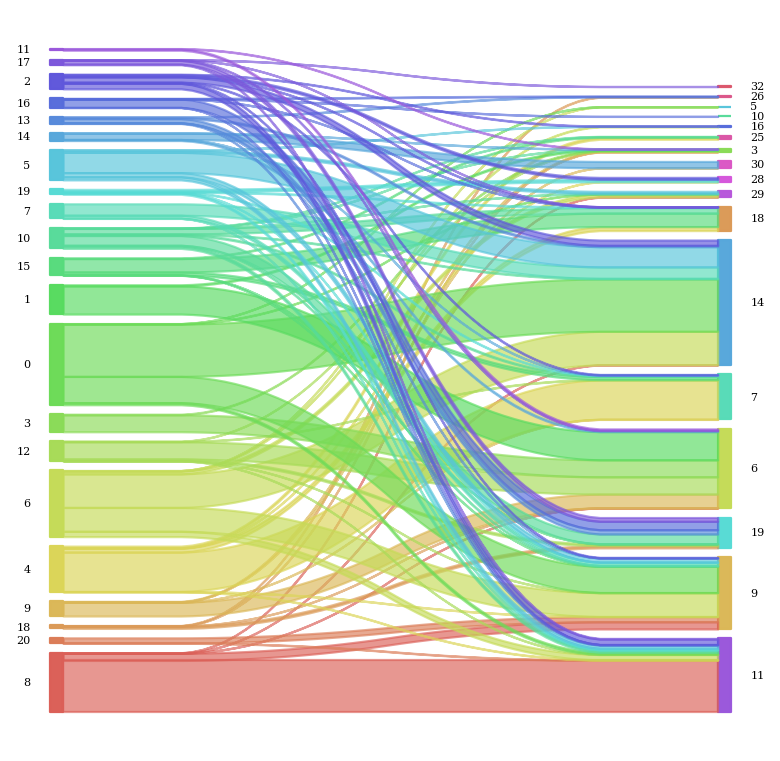

In [92]:
#around 38 clusters identified by leiden

#latent vs protein

sankey.sankey(leiden_rna.obs.leiden, leiden_prot.obs.leiden, aspect=20, fontsize=5)

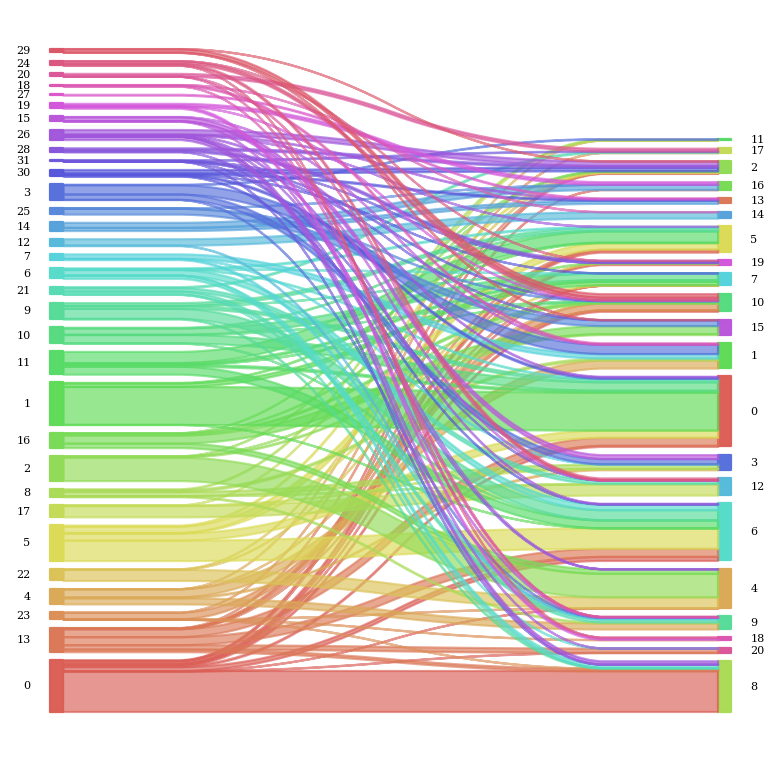

In [93]:
#latent vs rna

sankey.sankey(leiden_latent.obs.leiden, leiden_rna.obs.leiden, aspect=20, fontsize=5)

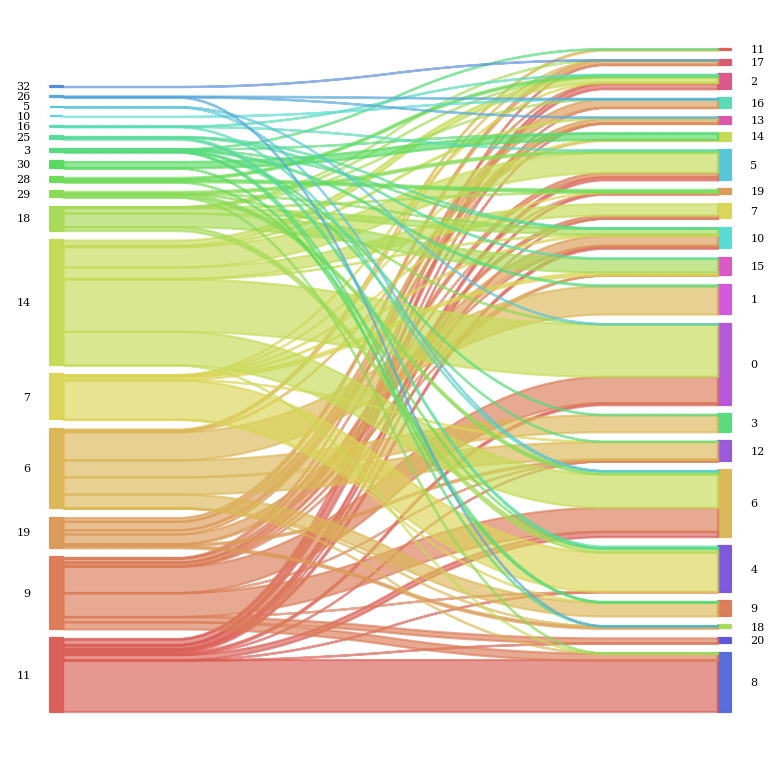

In [113]:
#protein vs rna

sankey.sankey(leiden_prot.obs.leiden, leiden_rna.obs.leiden, aspect=20, fontsize=5)

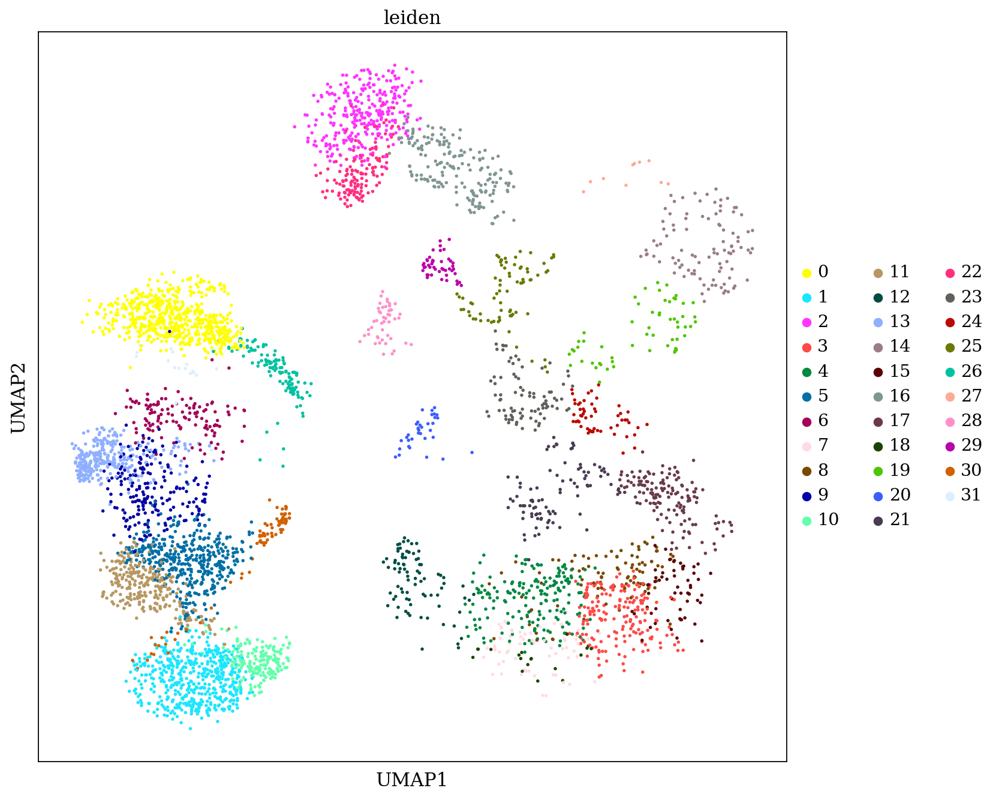

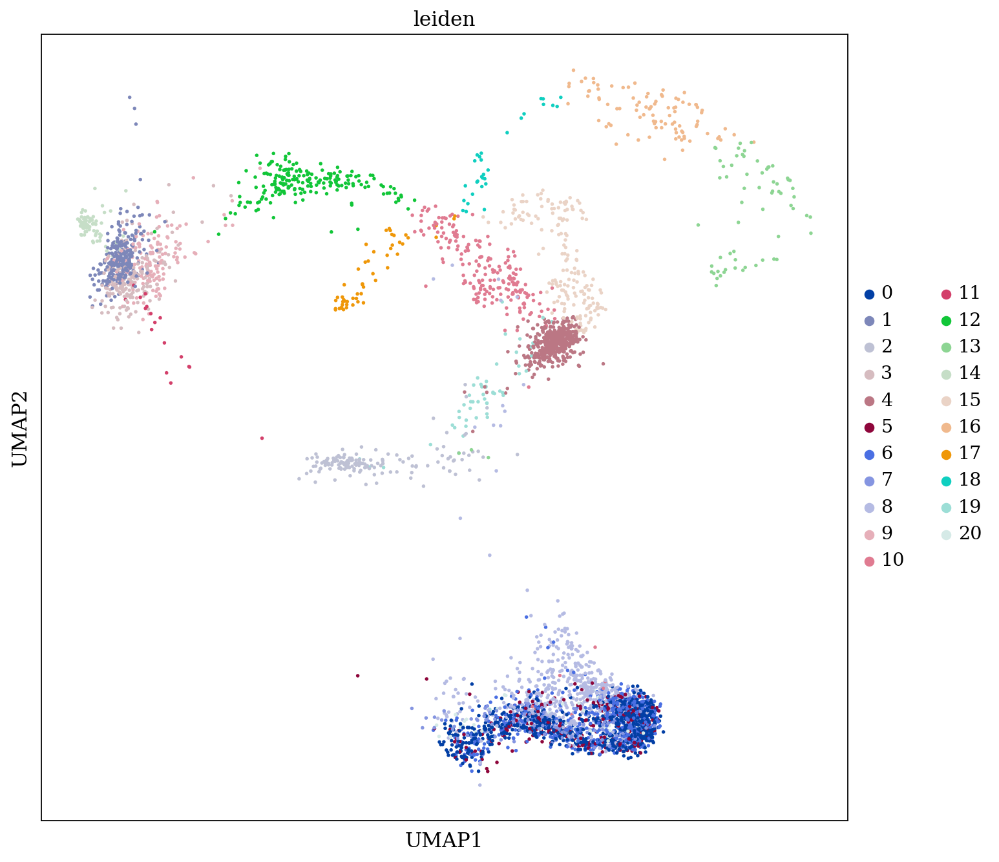

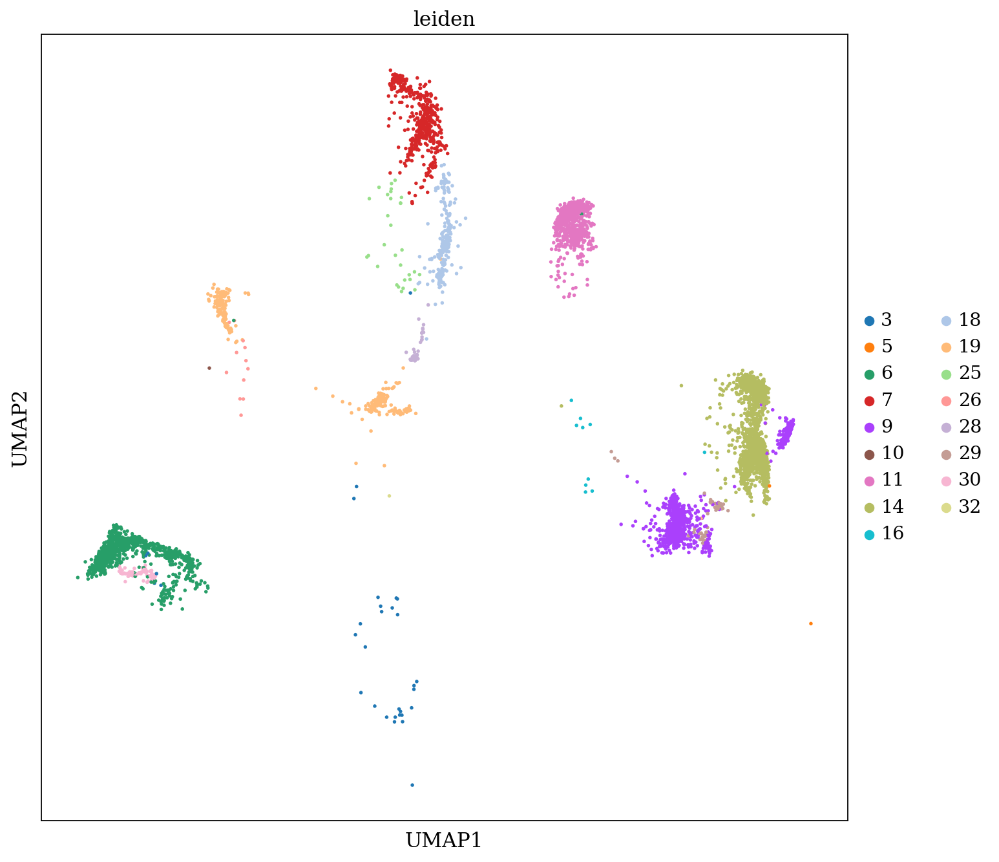

In [115]:
sc.set_figure_params(figsize=(10, 10))

sc.pl.umap(leiden_latent, color = ['leiden'], color_map ='viridis')
           
sc.pl.umap(leiden_rna, color = ['leiden'], color_map ='viridis')

sc.pl.umap(leiden_prot, color = ['leiden'], color_map ='viridis')

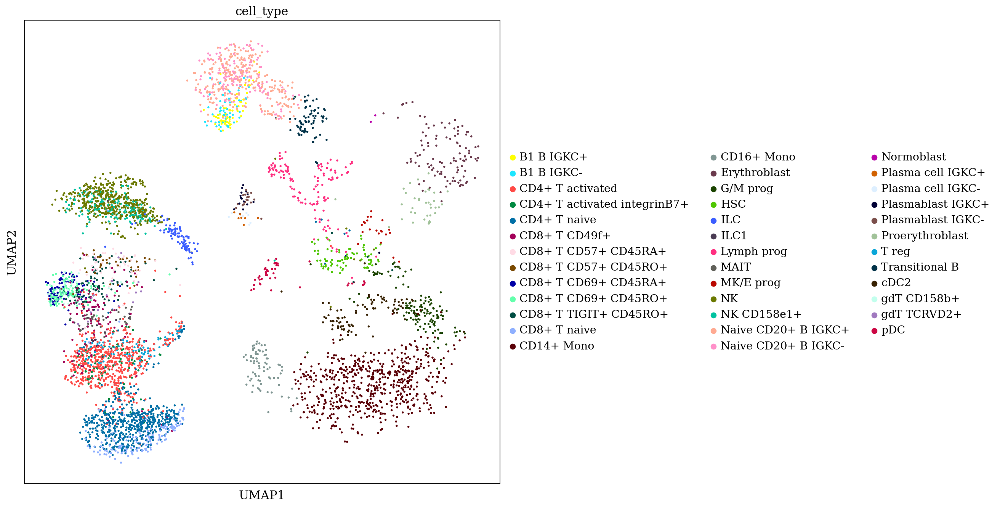

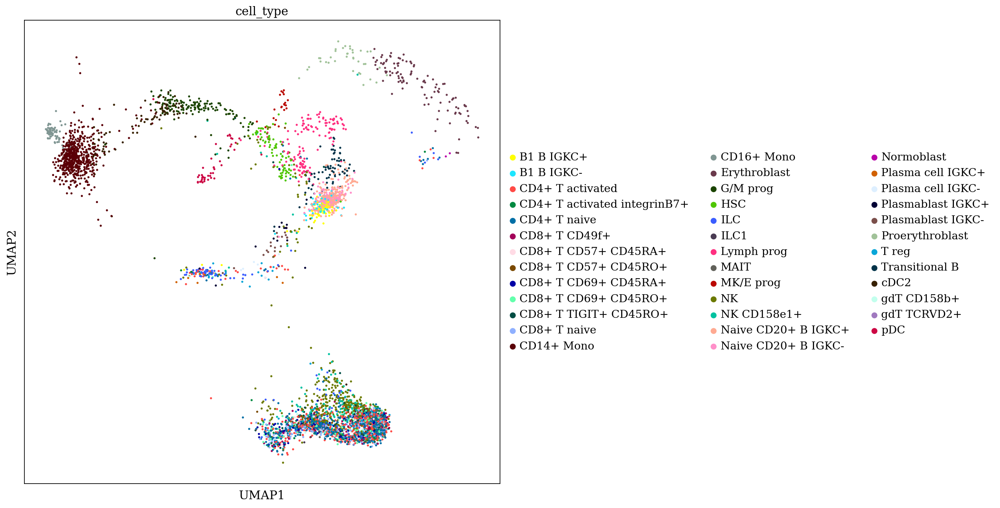

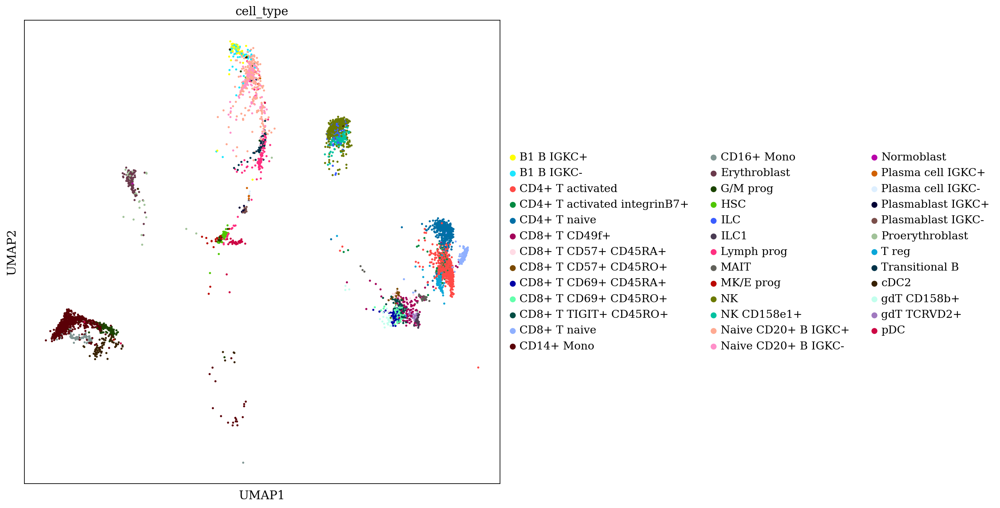

In [124]:
sc.set_figure_params(figsize=(10, 10))

sc.pl.umap(leiden_latent, color = ['cell_type'], color_map ='viridis')
           
sc.pl.umap(leiden_rna, color = ['cell_type'], color_map ='viridis')

sc.pl.umap(leiden_prot, color = ['cell_type'], color_map ='viridis')

### Sample, s1d1

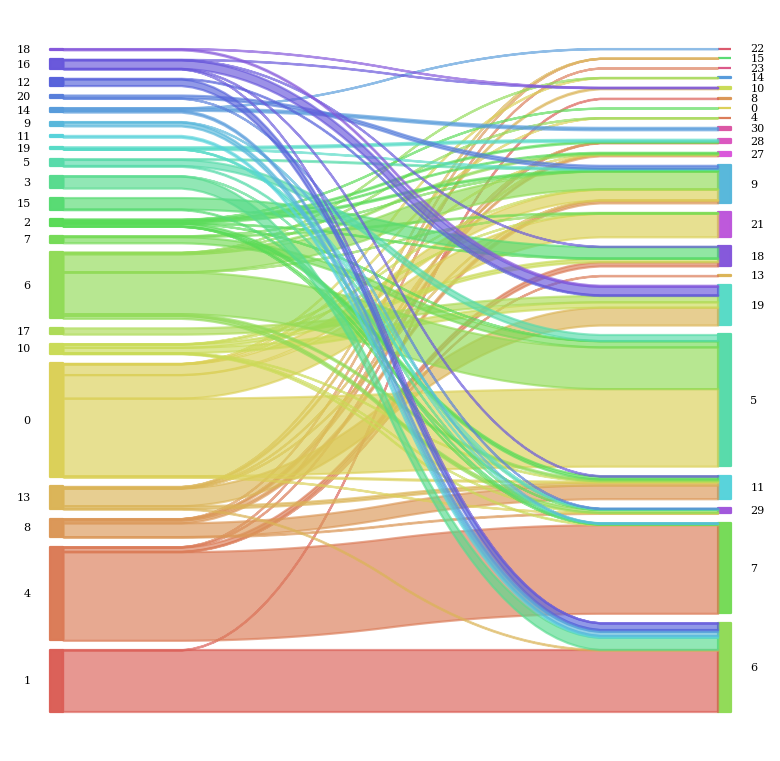

In [120]:
#latent vs protein

sankey.sankey(leiden_rna_s1d1.obs.leiden, leiden_prot_s1d1.obs.leiden, aspect=20, fontsize=5)

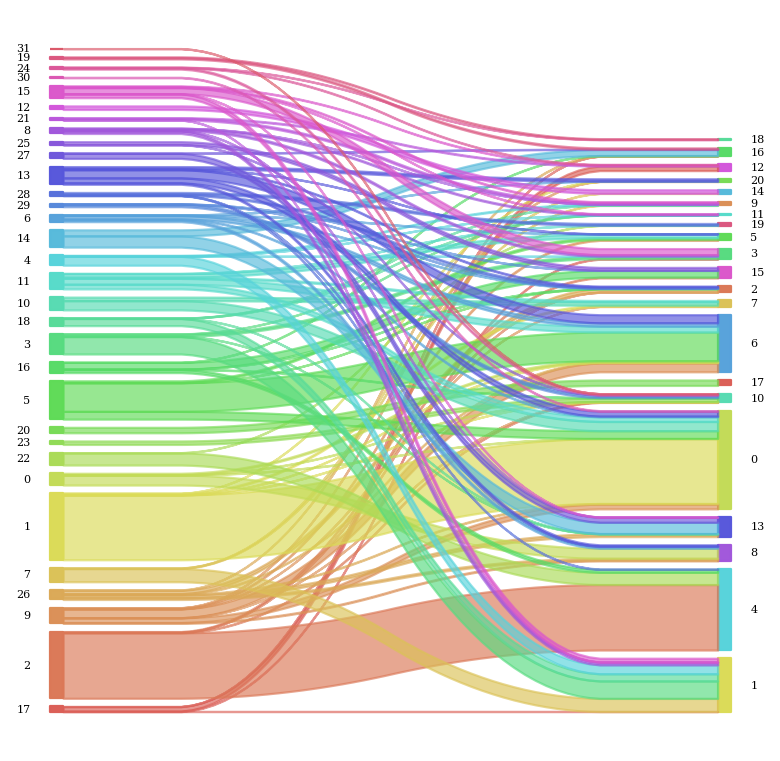

In [121]:
#latent vs rna

sankey.sankey(leiden_latent_s1d1.obs.leiden, leiden_rna_s1d1.obs.leiden, aspect=20, fontsize=5)

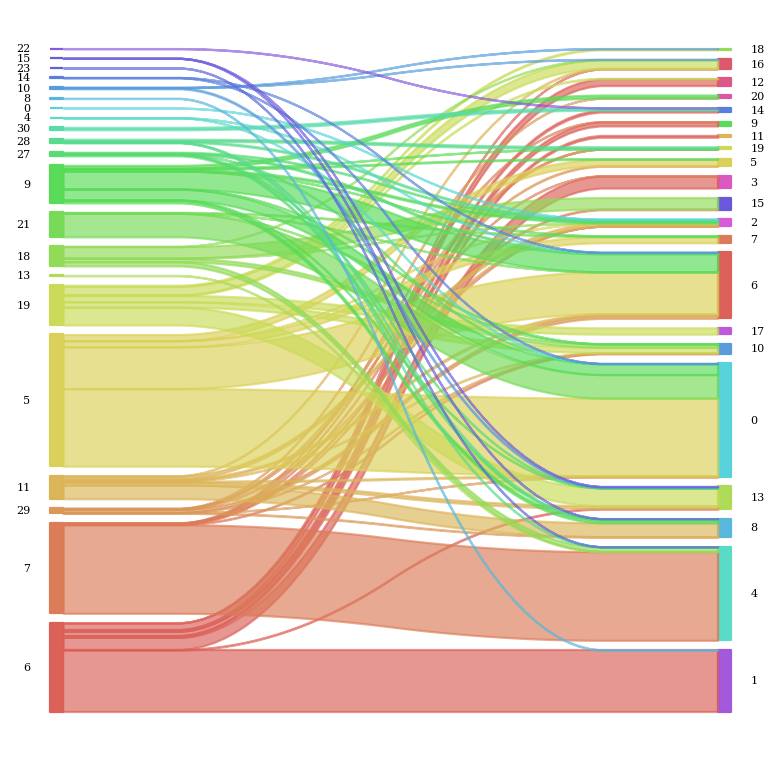

In [122]:
#protein vs rna

sankey.sankey(leiden_prot_s1d1.obs.leiden, leiden_rna_s1d1.obs.leiden, aspect=20, fontsize=5)

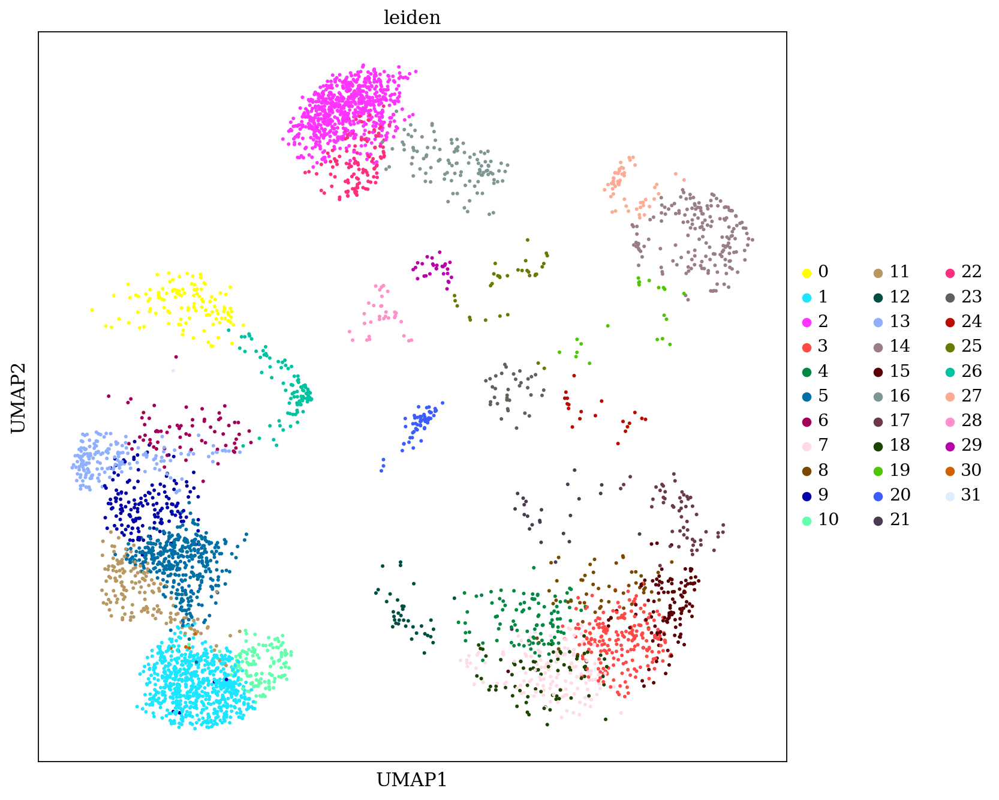

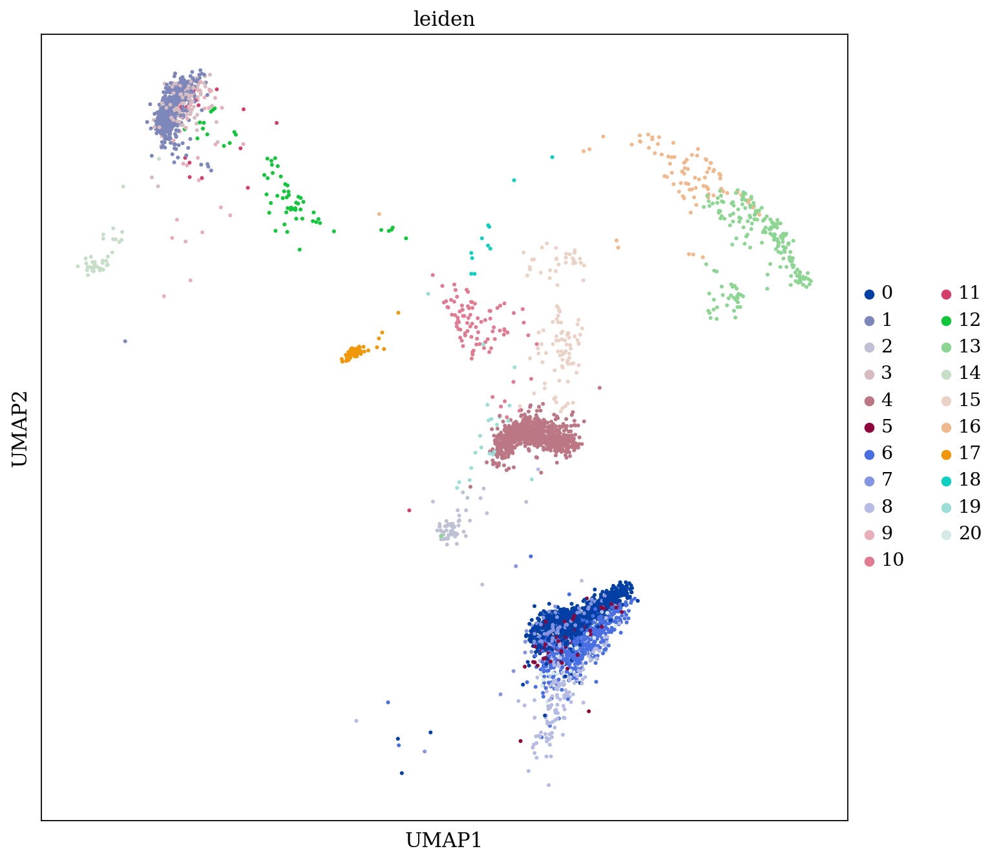

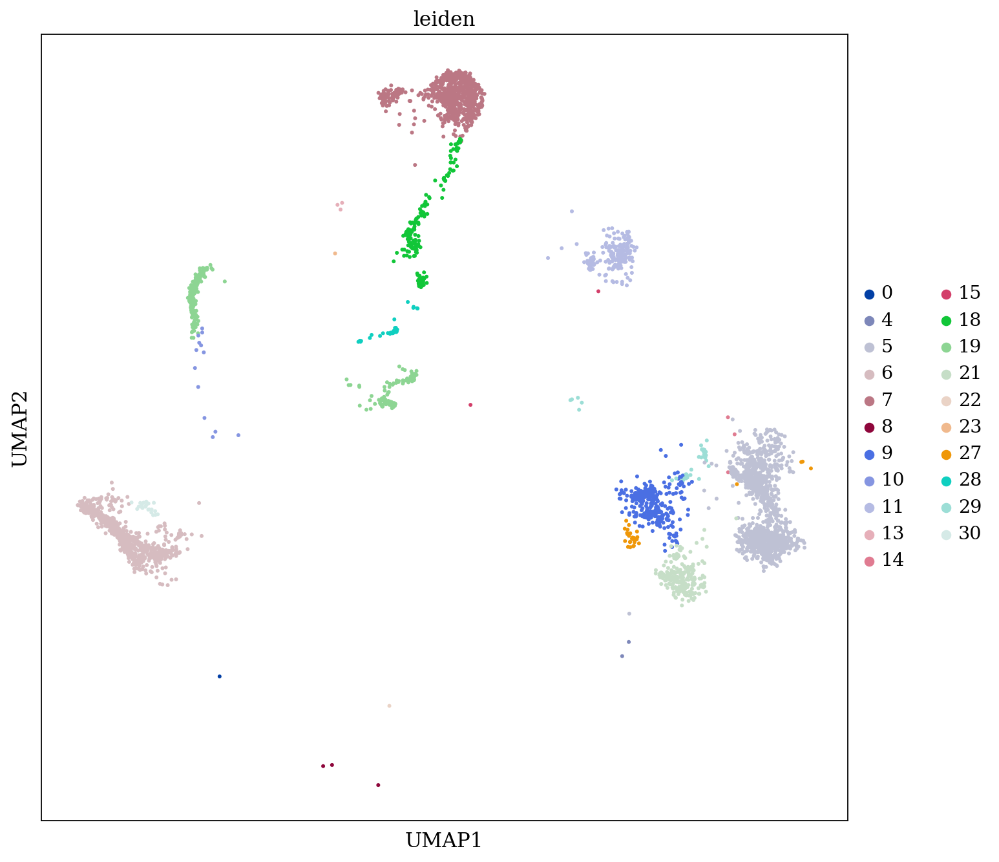

In [123]:
sc.set_figure_params(figsize=(10, 10))

sc.pl.umap(leiden_latent_s1d1, color = ['leiden'], color_map ='viridis')
           
sc.pl.umap(leiden_rna_s1d1, color = ['leiden'], color_map ='viridis')

sc.pl.umap(leiden_prot_s1d1, color = ['leiden'], color_map ='viridis')

### Only NK cells (and ILC + gd T)

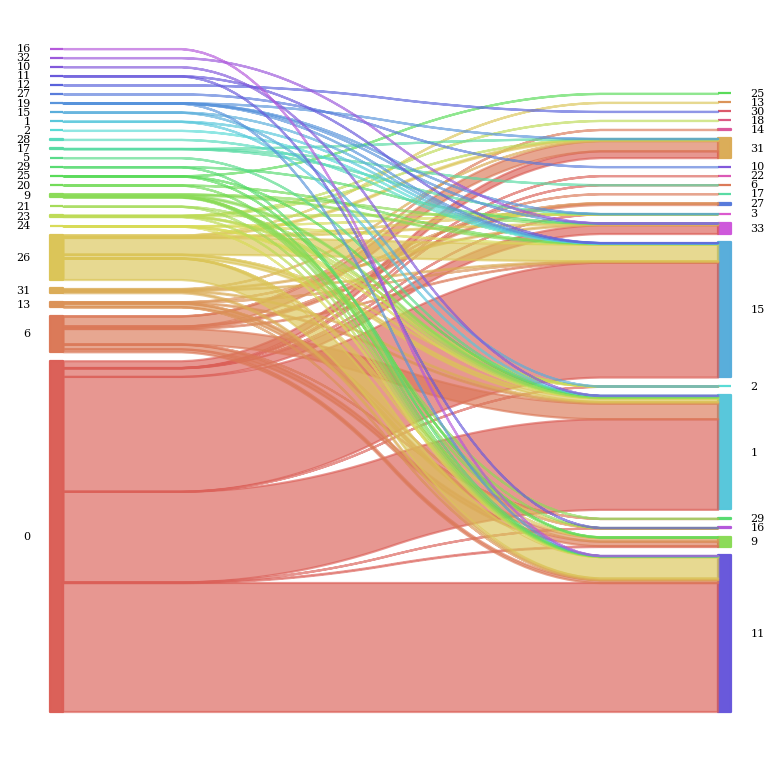

In [107]:
#latent vs protein

sankey.sankey(leiden_latent_nk.obs.leiden, leiden_prot_nk.obs.leiden, aspect=20, fontsize=5)

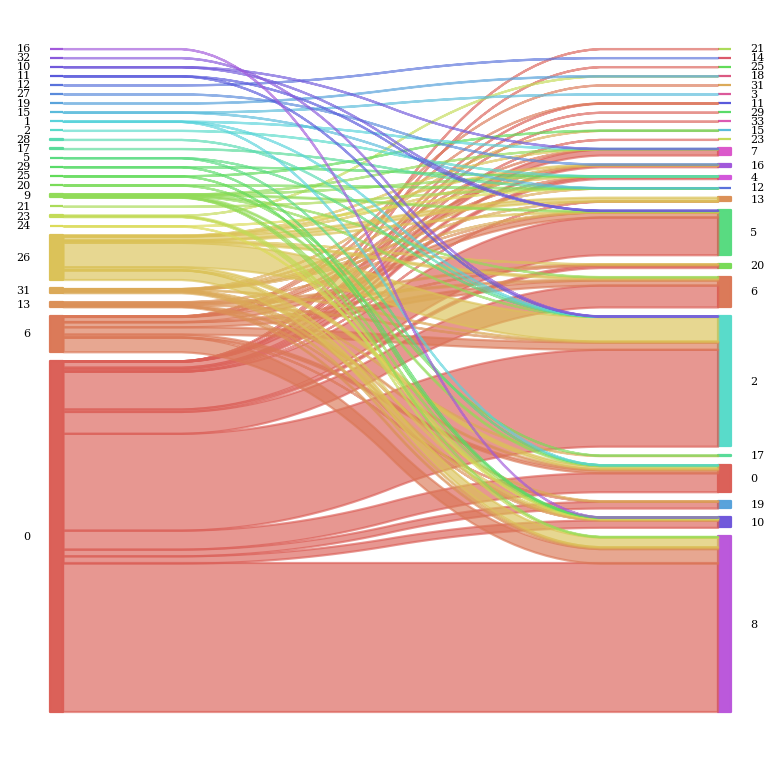

In [109]:
#latent vs rna

sankey.sankey(leiden_latent_nk.obs.leiden, leiden_rna_nk.obs.leiden, aspect=20, fontsize=5)

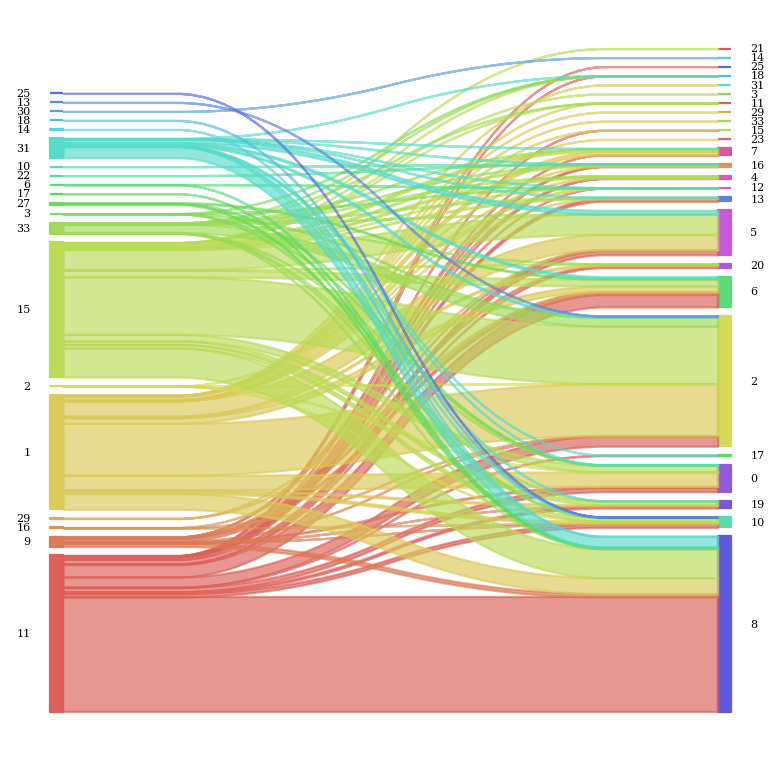

In [110]:
#protein vs rna

sankey.sankey(leiden_prot_nk.obs.leiden, leiden_rna_nk.obs.leiden, aspect=20, fontsize=5)

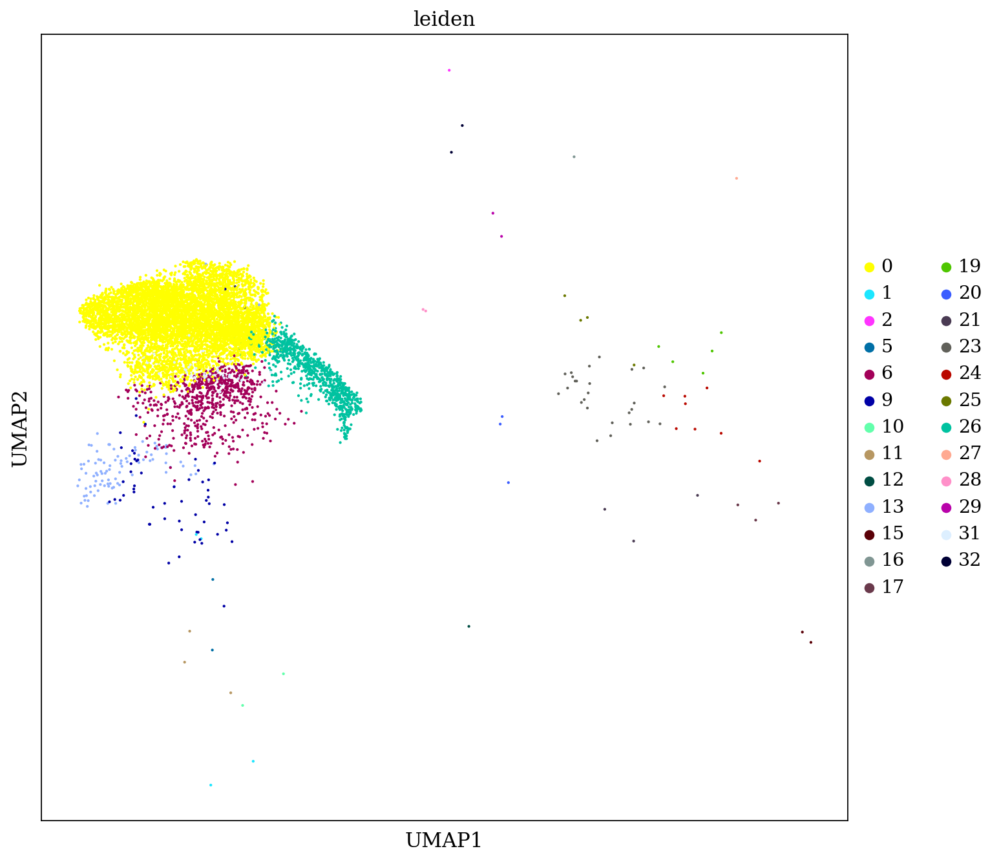

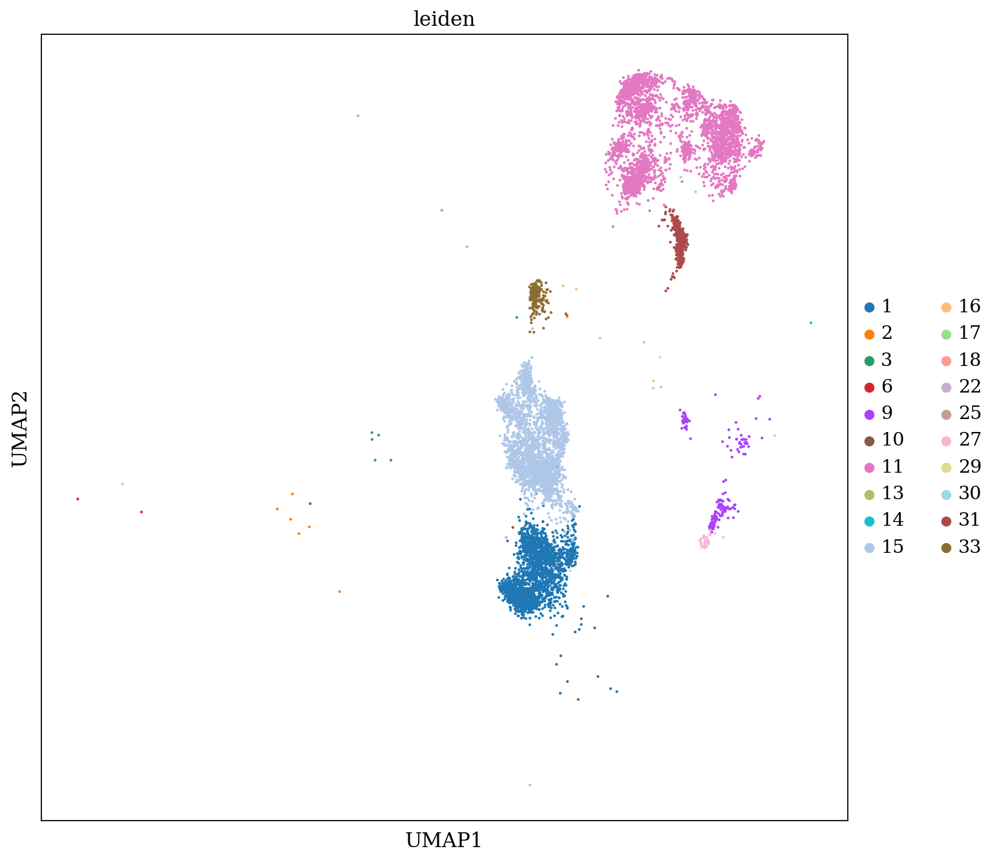

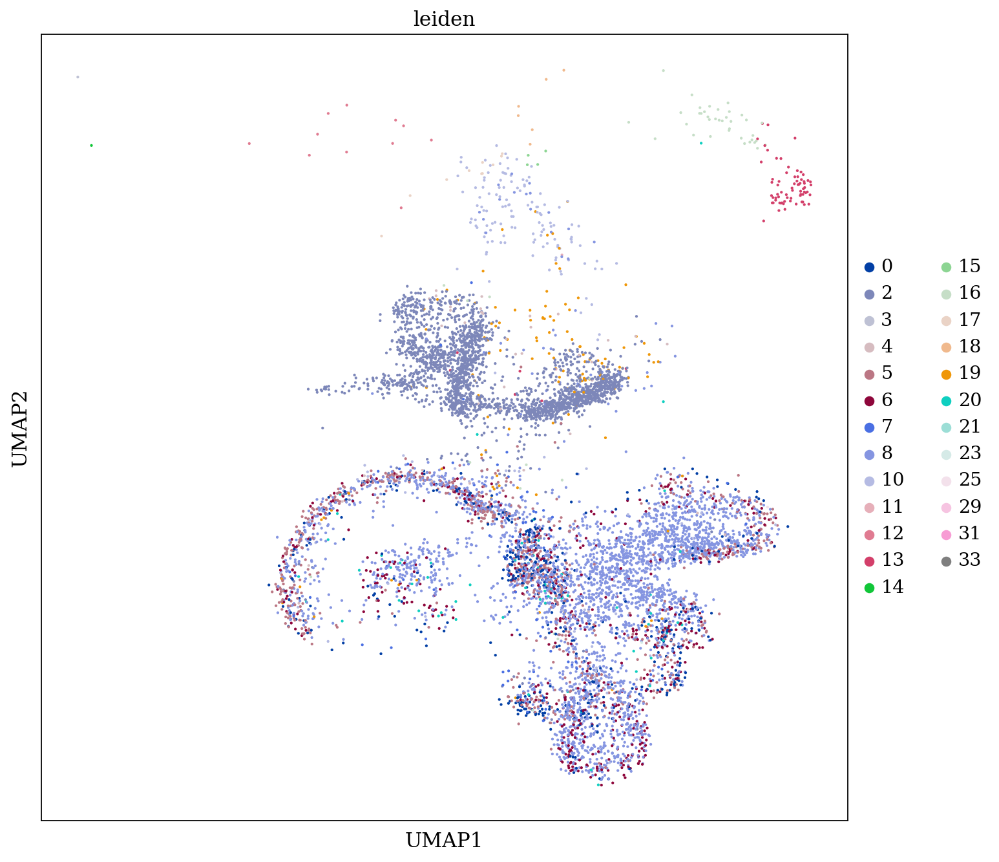

In [116]:
sc.set_figure_params(figsize=(10, 10))

sc.pl.umap(leiden_latent_nk, color = ['leiden'], color_map ='viridis')

sc.pl.umap(leiden_prot_nk, color = ['leiden'], color_map ='viridis')
           
sc.pl.umap(leiden_rna_nk, color = ['leiden'], color_map ='viridis')